## Chess game dataset



### Necessary libraries

In [1]:
import plotly.express as px
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import warnings


### Chess dataset

In [2]:
df = pd.read_csv (r'C:\Users\Ada\Downloads\games.csv')

#### First 5 rows of the dataset

In [3]:
df.head()

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply
0,TZJHLljE,False,1.500000e+12,1.500000e+12,13,outoftime,white,15+2,bourgris,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5
1,l1NXvwaE,True,1.500000e+12,1.500000e+12,16,resign,black,5+10,a-00,1322,skinnerua,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4
2,mIICvQHh,True,1.500000e+12,1.500000e+12,61,mate,white,5+10,ischia,1496,a-00,1500,e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...,C20,King's Pawn Game: Leonardis Variation,3
3,kWKvrqYL,True,1.500000e+12,1.500000e+12,61,mate,white,20+0,daniamurashov,1439,adivanov2009,1454,d4 d5 Nf3 Bf5 Nc3 Nf6 Bf4 Ng4 e3 Nc6 Be2 Qd7 O...,D02,Queen's Pawn Game: Zukertort Variation,3
4,9tXo1AUZ,True,1.500000e+12,1.500000e+12,95,mate,white,30+3,nik221107,1523,adivanov2009,1469,e4 e5 Nf3 d6 d4 Nc6 d5 Nb4 a3 Na6 Nc3 Be7 b4 N...,C41,Philidor Defense,5


#### General information about variables of the data

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20058 entries, 0 to 20057
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              20058 non-null  object 
 1   rated           20058 non-null  bool   
 2   created_at      20058 non-null  float64
 3   last_move_at    20058 non-null  float64
 4   turns           20058 non-null  int64  
 5   victory_status  20058 non-null  object 
 6   winner          20058 non-null  object 
 7   increment_code  20058 non-null  object 
 8   white_id        20058 non-null  object 
 9   white_rating    20058 non-null  int64  
 10  black_id        20058 non-null  object 
 11  black_rating    20058 non-null  int64  
 12  moves           20058 non-null  object 
 13  opening_eco     20058 non-null  object 
 14  opening_name    20058 non-null  object 
 15  opening_ply     20058 non-null  int64  
dtypes: bool(1), float64(2), int64(4), object(9)
memory usage: 2.3+ MB


#### Descriptive statistics of numeric variables

In [5]:
df.describe()

,created_at,last_move_at,turns,white_rating,black_rating,opening_ply
count,2.005800e+04,2.005800e+04,20058.000000,20058.000000,20058.000000,20058.000000
mean,1.483208e+12,1.483208e+12,60.465999,1596.631868,1588.831987,4.816981
std,2.831972e+10,2.831967e+10,33.570585,291.253376,291.036126,2.797152
min,1.376770e+12,1.376770e+12,1.000000,784.000000,789.000000,1.000000
25%,1.479640e+12,1.479642e+12,37.000000,1398.000000,1391.000000,3.000000
50%,1.497030e+12,1.497030e+12,55.000000,1567.000000,1562.000000,4.000000
75%,1.500708e+12,1.500708e+12,79.000000,1793.000000,1784.000000,6.000000
max,1.504490e+12,1.504490e+12,349.000000,2700.000000,2723.000000,28.000000


#### Checking missing values

In [6]:
df.isnull().sum()

id                0
rated             0
created_at        0
last_move_at      0
turns             0
victory_status    0
winner            0
increment_code    0
white_id          0
white_rating      0
black_id          0
black_rating      0
moves             0
opening_eco       0
opening_name      0
opening_ply       0
dtype: int64

#### Duplications dropping

In [7]:
sum(df.duplicated())

429

In [8]:
df.drop_duplicates(keep='first', inplace=True)

### Pairplot of numeric variables 
#### This will show us their distributions

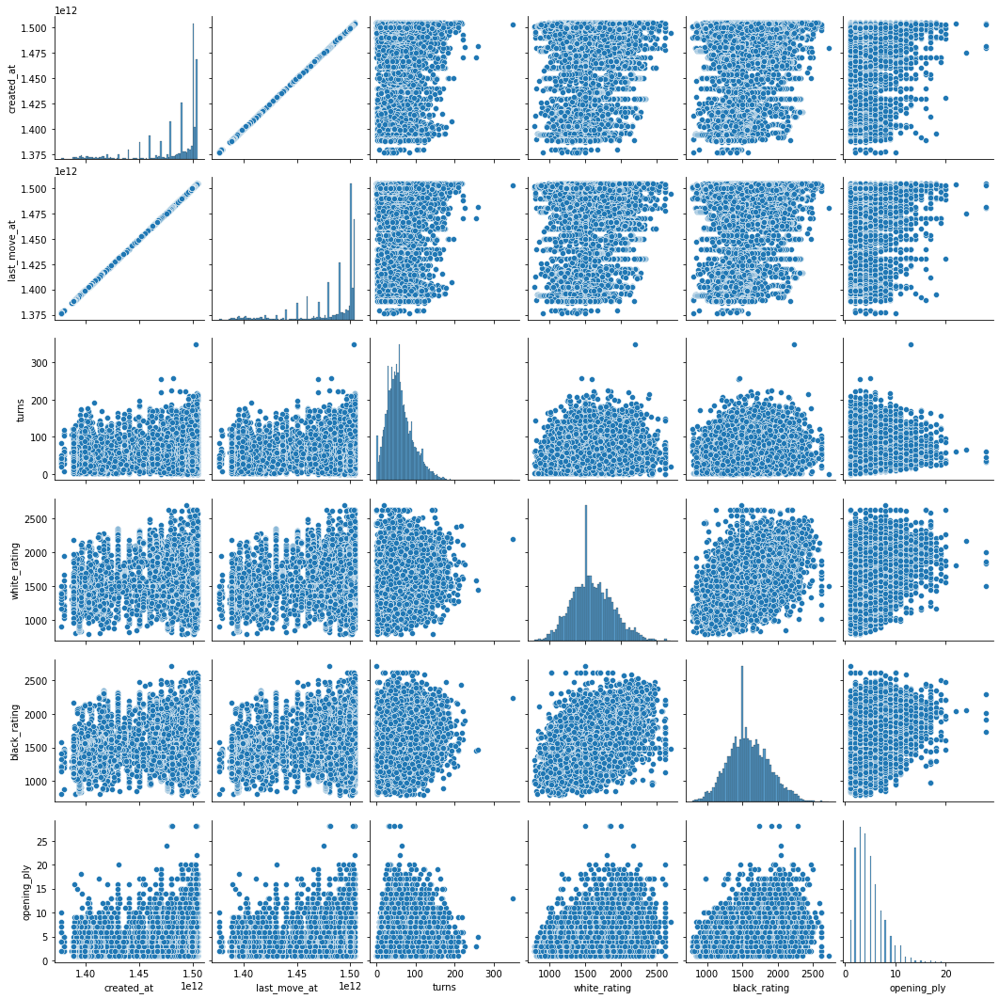

In [9]:
cols = ['created_at','last_move_at','turns', 'white_rating', 'black_rating','opening_ply']
sns.pairplot(df, vars = cols)

### Distributions of blacks' and writes' ratings(points).
#### As we can notice for both player points are distributed especially in about 1500 ratings. And other ratings behave themselves similarly for whites and blacks.

In [10]:
rating_white = df.groupby('white_rating')[['white_id']].count().sort_values('white_id',ascending = False).head(20)

In [11]:
rating_black = df.groupby('black_rating')[['black_id']].count().sort_values('black_id',ascending = False).head(20)

C:\Users\Ada\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Ada\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


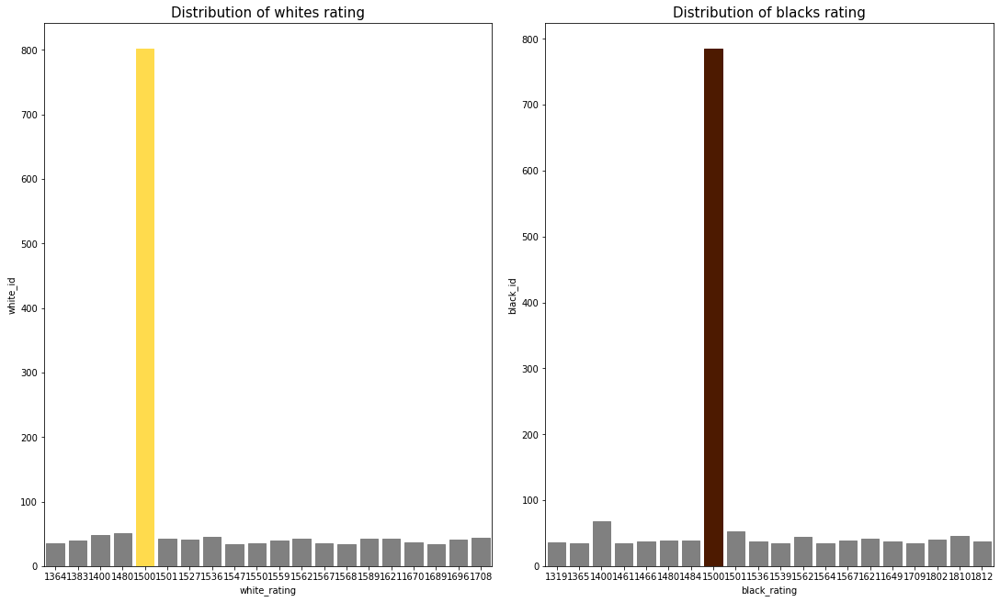

In [12]:
import matplotlib.gridspec as gridspec
fig2= plt.figure(constrained_layout=True, figsize = (15,9))
spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig2)
f2_ax1 = fig2.add_subplot(spec2[0, 0])
g1 = sns.barplot(rating_white.index,rating_white.white_id, ax = f2_ax1)

f2_ax1.set_title('Distribution of whites rating',size = 15)
f2_ax2 = fig2.add_subplot(spec2[0, 1])
g2 = sns.barplot(rating_black.index,rating_black.black_id, ax = f2_ax2)
f2_ax2.set_title('Distribution of blacks rating',size = 15)
for bar in g1.patches:
    if bar.get_height() > 700:
        bar.set_color('#ffdb4d')    
    else:
        bar.set_color('grey')

for bar in g2.patches:
    if bar.get_height() > 700:
        bar.set_color('#4d1a00')    
    else:
        bar.set_color('grey')
        

In [14]:
df1 = df[df.winner == 'white']
fig = px.scatter(df1, x="white_rating", y="turns", animation_frame="opening_ply", 
            color="winner", hover_name="victory_status")
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1000

fig.show()

## Distribution of turns

C:\Users\Ada\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0, 0.5, 'Density')

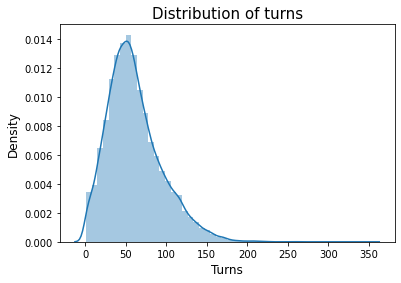

In [15]:
sns.distplot(df.turns)
plt.title('Distribution of turns',size = 15)
plt.xlabel('Turns',size = 12)
plt.ylabel('Density', size = 12)

## Correlation matrix

### As we can see there is  a high correlation between ratings of black and white players. In my opinion this is obvious, as if one lose a game , other gets points

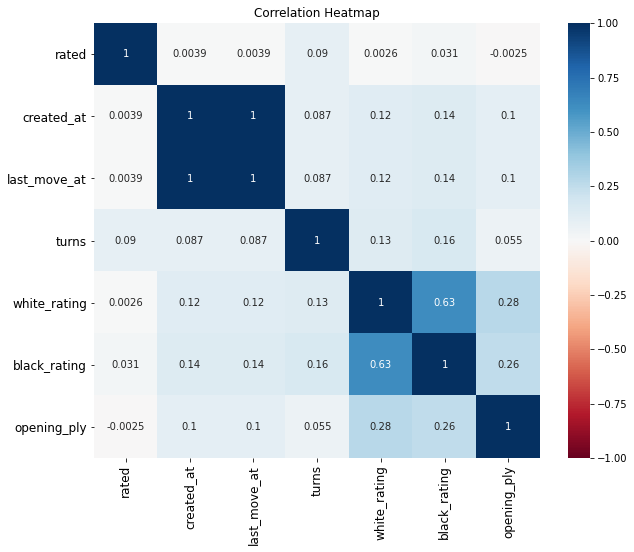

In [16]:
plt.figure(figsize = (10, 8))
s = sns.heatmap(df.corr(),
               annot = True, 
               cmap = 'RdBu',
               vmin = -1, 
               vmax = 1)

s.set_yticklabels(s.get_yticklabels(), rotation = 0, fontsize = 12)
s.set_xticklabels(s.get_xticklabels(), rotation = 90, fontsize = 12)
plt.title('Correlation Heatmap')
plt.show()

## Hypothesis testing
#### 1. In chess game, the player with white pieces has an advantage as they are the one who starts the game and makes the first  move. Try to prove it with the data and dataviz. (Are they actually winning more games. Be careful to avoid all possible biases when creating charts :))
#### 2. Does the length of the game (# of moves affect the result?). There are 3 possible results in chess game: white wins, black wins, game ends in draw(no one wins).
#### 3. Which openings (the set of first several moves in chess are called openings. As some sequences of moves are very common, they got their names, for example: Queen's gambit, etc.) are the best? Maybe at different levels (rating levels) different openings are performing better?

### Among winners white players are on the first place, then come blacks.
### In order to approve or reject first hypothesis we need more information about whites.

C:\Users\Ada\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



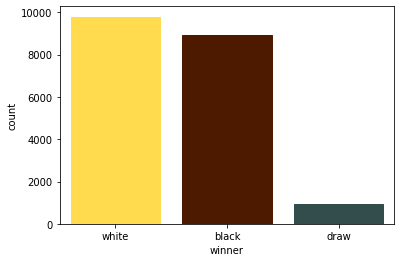

In [17]:
g1 = sns.countplot(df['winner']) 
colors = ['#ffdb4d','#4d1a00','#334d4d']
#for bar in g3.patches:
   # if bar.get_height() < 7000:
   #     bar.set_color('green') 
   # elif: bar.get_height() 
   # else:
    #    bar.set_color('grey')

for i in range(0,3):
    g1.patches[i].set_color(colors[i])
    

In [18]:
df.winner.value_counts()

white    9792
black    8919
draw      918
Name: winner, dtype: int64

### Above we see that the number of turns is higher for draws. Then comes blacks  and whites. So in terms of moves whites do not have any advantage.

Text(0.5, 1.0, 'The relation of turns and winners')

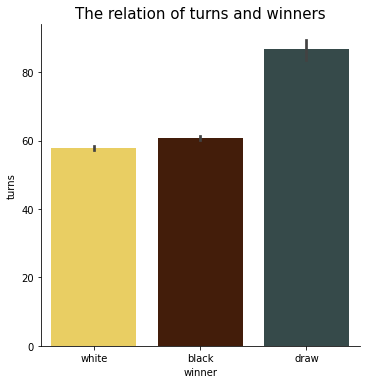

In [19]:
g3 = sns.catplot( data =df, x = "winner", y ="turns",kind = "bar",palette=sns.color_palette(['#ffdb4d','#4d1a00','#334d4d']))
plt.title('The relation of turns and winners',size = 15)

In [20]:
group1 = df.groupby('victory_status')['winner'].value_counts().reset_index(name = 'values')


In [21]:
group1

,victory_status,winner,values
0,draw,draw,874
1,mate,white,3273
2,mate,black,2915
3,outoftime,black,805
4,outoftime,white,792
5,outoftime,draw,44
6,resign,white,5727
7,resign,black,5199


In [23]:
table = pd.pivot_table(group1,values='values', index=['victory_status'],
                    columns=['winner'])

In [24]:
table

winner,black,draw,white
victory_status,,,
draw,NaN,874.0,NaN
mate,2915.0,NaN,3273.0
outoftime,805.0,44.0,792.0
resign,5199.0,NaN,5727.0


### In this dataset resign occures more frequently as a vistory status. The next is mate. For these victory statuses white players are more than black ones. 

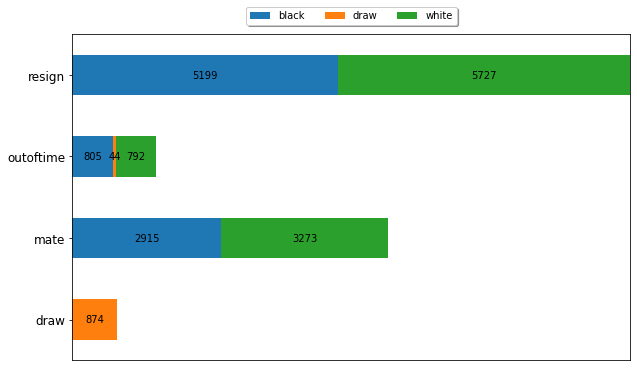

In [25]:
ax1 = table.plot(kind = 'barh', stacked = True,figsize=(10, 6))
plt.title(' ', size = 20)
plt.ylabel('')
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
plt.yticks(rotation=360, size = 12)
plt.xlim(0, np.sum(table, axis=1).max())
plt.legend()
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.1),ncol=4, fancybox=True, shadow=True)
for p in ax.patches:
    left, bottom, width, height = p.get_bbox().bounds
    if width > 0:
         ax.annotate(f'{width:0.0f}', xy=(left+width/2, bottom+height/2), ha='center', va='center');
colors = ['#ffdb4d','#4d1a00','#334d4d']


#### Creating two dataframes vor white and black winners and selecting "Defense" game strategy for them

In [26]:
df1 = df[df.winner == 'white']

In [27]:
df1

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply
0,TZJHLljE,False,1.500000e+12,1.500000e+12,13,outoftime,white,15+2,bourgris,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5
2,mIICvQHh,True,1.500000e+12,1.500000e+12,61,mate,white,5+10,ischia,1496,a-00,1500,e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...,C20,King's Pawn Game: Leonardis Variation,3
3,kWKvrqYL,True,1.500000e+12,1.500000e+12,61,mate,white,20+0,daniamurashov,1439,adivanov2009,1454,d4 d5 Nf3 Bf5 Nc3 Nf6 Bf4 Ng4 e3 Nc6 Be2 Qd7 O...,D02,Queen's Pawn Game: Zukertort Variation,3
4,9tXo1AUZ,True,1.500000e+12,1.500000e+12,95,mate,white,30+3,nik221107,1523,adivanov2009,1469,e4 e5 Nf3 d6 d4 Nc6 d5 Nb4 a3 Na6 Nc3 Be7 b4 N...,C41,Philidor Defense,5
6,qwU9rasv,True,1.500000e+12,1.500000e+12,33,resign,white,10+0,capa_jr,1520,daniel_likes_chess,1423,d4 d5 e4 dxe4 Nc3 Nf6 f3 exf3 Nxf3 Nc6 Bb5 a6 ...,D00,Blackmar-Diemer Gambit: Pietrowsky Defense,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20050,nYOvevdh,True,1.499810e+12,1.499810e+12,9,outoftime,white,10+0,jamboger,1243,yamaguchipolgar,1142,c4 e5 d4 exd4 Qxd4 Nf6 Bg5 Be7 e4,A20,English Opening: King's English Variation,2
20052,EopEqqAa,True,1.499810e+12,1.499810e+12,37,resign,white,10+10,jamboger,1219,samael88,1250,c4 e6 d4 b6 Nc3 Bb7 Nf3 g6 h4 Bg7 Bg5 f6 Bf4 d...,A40,English Defense,4
20053,EfqH7VVH,True,1.499790e+12,1.499790e+12,24,resign,white,10+10,belcolt,1691,jamboger,1220,d4 f5 e3 e6 Nf3 Nf6 Nc3 b6 Be2 Bb7 O-O Be7 Ne5...,A80,Dutch Defense,2
20055,yrAas0Kj,True,1.499700e+12,1.499700e+12,35,mate,white,10+0,jamboger,1219,schaaksmurf3,1286,d4 d5 Bf4 Nc6 e3 Nf6 c3 e6 Nf3 Be7 Bd3 O-O Nbd...,D00,Queen's Pawn Game: Mason Attack,3


In [28]:
df2 = df1[df1['opening_name'].str.contains("Defense")]

In [29]:
df2.head()

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply
0,TZJHLljE,False,1.500000e+12,1.500000e+12,13,outoftime,white,15+2,bourgris,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5
4,9tXo1AUZ,True,1.500000e+12,1.500000e+12,95,mate,white,30+3,nik221107,1523,adivanov2009,1469,e4 e5 Nf3 d6 d4 Nc6 d5 Nb4 a3 Na6 Nc3 Be7 b4 N...,C41,Philidor Defense,5
6,qwU9rasv,True,1.500000e+12,1.500000e+12,33,resign,white,10+0,capa_jr,1520,daniel_likes_chess,1423,d4 d5 e4 dxe4 Nc3 Nf6 f3 exf3 Nxf3 Nc6 Bb5 a6 ...,D00,Blackmar-Diemer Gambit: Pietrowsky Defense,10
9,afoMwnLg,True,1.500000e+12,1.500000e+12,119,mate,white,10+0,daniel_likes_chess,1381,mirco25,1209,e4 d5 exd5 Qxd5 Nc3 Qe5+ Be2 Na6 d4 Qf5 Bxa6 b...,B01,Scandinavian Defense: Mieses-Kotroc Variation,4
21,QFCZwY1f,False,1.500000e+12,1.500000e+12,3,resign,white,30+60,shivangithegenius,1094,themannichreaction,1068,d4 e6 Nc3,A40,Horwitz Defense,2


In [30]:
df3 = df[df.winner == 'black']

In [31]:
df4 = df3[df3['opening_name'].str.contains("Defense")]

In [32]:
df4.head()

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply
1,l1NXvwaE,True,1.500000e+12,1.500000e+12,16,resign,black,5+10,a-00,1322,skinnerua,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4
7,RVN0N3VK,False,1.500000e+12,1.500000e+12,9,resign,black,15+30,daniel_likes_chess,1413,soultego,2108,e4 Nc6 d4 e5 d5 Nce7 c3 Ng6 b4,B00,Nimzowitsch Defense: Kennedy Variation | Link...,5
11,Vf5fKWzI,False,1.500000e+12,1.500000e+12,38,resign,black,20+60,daniel_likes_chess,1381,subham777,1867,e4 e6 d4 d5 e5 c5 c3 Nc6 Nf3 Qb6 Be3 Qxb2 Nbd2...,C02,French Defense: Advance Variation | Paulsen A...,9
12,HRti5mKv,False,1.500000e+12,1.500000e+12,60,resign,black,5+40,daniel_likes_chess,1381,roman12342005,1936,e4 e6 Nf3 d5 exd5 exd5 Qe2+ Be7 Nc3 Nf6 d4 O-O...,C00,French Defense: Knight Variation,3
13,2fEjSei6,False,1.500000e+12,1.500000e+12,31,resign,black,8+0,daniel_likes_chess,1381,alkhan,1607,e4 e6 Qh5 g6 Qe5 Nf6 d4 d6 Qb5+ Bd7 Qxb7 Bc6 Q...,C00,French Defense #2,2


In [33]:
group2 = df2.groupby(['opening_name'])[['winner']].count().reset_index().sort_values('winner',ascending = False).head(10)

In [34]:
group2

,opening_name,winner
533,Scandinavian Defense: Mieses-Kotroc Variation,159
554,Sicilian Defense,147
170,French Defense: Knight Variation,133
394,Philidor Defense #3,120
566,Sicilian Defense: Bowdler Attack,119
231,Horwitz Defense,110
49,Caro-Kann Defense,106
237,Italian Game: Anti-Fried Liver Defense,91
520,Scandinavian Defense,90
393,Philidor Defense #2,87


In [35]:
group3 = df4.groupby(['opening_name'])[['winner']].count().reset_index().sort_values('winner',ascending = False).head(10)

In [36]:
group3

,opening_name,winner
518,Sicilian Defense,191
531,Sicilian Defense: Bowdler Attack,162
484,Scandinavian Defense,122
159,French Defense: Knight Variation,118
363,Philidor Defense #2,95
217,Horwitz Defense,93
620,Sicilian Defense: Old Sicilian,91
497,Scandinavian Defense: Mieses-Kotroc Variation,88
302,Modern Defense,86
356,Owen Defense,83


####  The purpose of this study is to see if there is a connection between openings and winner status. Chosen "Defense" opening does not differ in proportion for white and black winners. Even if the state of the game is chosen by the blacks their winrate is nearly the same as that of whites.

In [37]:
plt.figure(figsize = (8,4))
fig = px.pie(group2, values='winner', names='opening_name', color_discrete_sequence=px.colors.sequential.Oranges)
fig.show()

<Figure size 576x288 with 0 Axes>

In [38]:
plt.figure(figsize = (8,4))
fig = px.pie(group3, values='winner', names='opening_name', color_discrete_sequence=px.colors.sequential.solar)
fig.show()


<Figure size 576x288 with 0 Axes>

###  There is no a big difference in openings between whites, blacks and draws.

<Figure size 936x720 with 0 Axes>

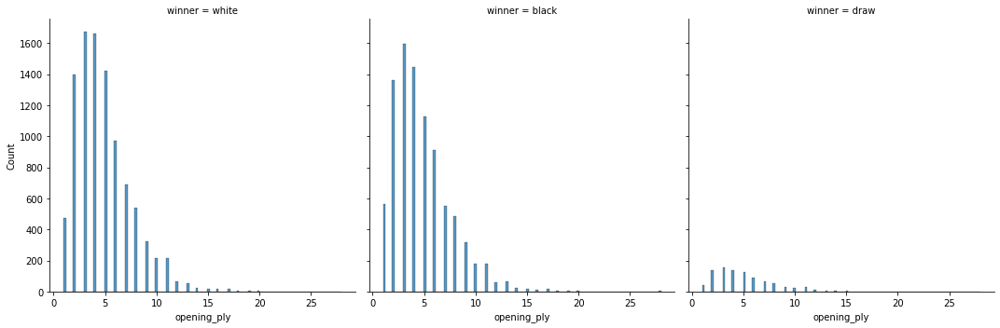

In [39]:
plt.figure(figsize = (13,10))
sns.displot(df, x="opening_ply", col="winner", multiple="dodge")


In [40]:
group5 = df.groupby('opening_ply')['white_id'].value_counts().reset_index(name = 'values').sort_values('values',ascending = False ).head(10)

In [41]:
group5

,opening_ply,white_id,values
0,1,bleda,43
708,2,1240100948,23
1,1,sveenemand,22
709,2,king5891,22
710,2,chess-brahs,20
711,2,marigw,18
4936,4,anakgreget,18
712,2,bobc,16
2550,3,khelil,16
2,1,andreas00,16


### Distribution of victory status

#### Resign is most frequently appearing victory status. The next is mate.

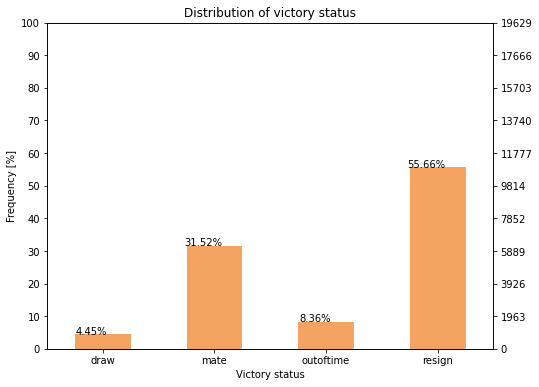

In [42]:
plt.figure(figsize=(8,6))
plt.title('Distribution of victory status')
plt.xlabel('Victory status')
plt.ylabel('Frequency [%]')
ax = (df.victory_status.value_counts()/len(df)*100).sort_index().plot(kind="bar", rot=0, color = 'sandybrown')
for p in ax.patches:
    ax.annotate('{:.2f}%'.format(p.get_height()), (p.get_x()+0.15, p.get_height()+1), ha = 'center', va = 'center')
ax.set_yticks(np.arange(0, 110, 10))

ax2 = ax.twinx()
ax2.set_yticks(np.arange(0, 110, 10)*len(df)/100)

#### Depending on turns draw is the most frequently appearing victory status, then comes outoftime. Apparently we can understand it. 

Text(0.5, 1.0, 'The relation between victory status and turns')

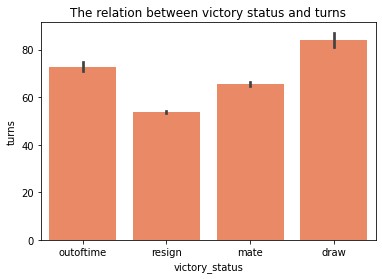

In [43]:
sns.barplot(x="victory_status", y="turns", data=df, color="coral")
sns.color_palette("vlag", as_cmap=True)
plt.title('The relation between victory status and turns')

#### From the plot below we see that as the  number of turns decreases the number of winners increases. But this plot has disadvantage, as we have victory status-resign, and have number of winners. Here we do not know who wins. 

In [44]:
tidy = df.groupby(['victory_status','turns'])['winner'].count().reset_index()
fig_bar_ = px.bar(tidy, x='victory_status', y='turns',  barmode='group', color = 'winner',color_discrete_sequence=['#334d4d','#4d1a00','#ffdb4d'])
fig_bar_.show()


### From this plot we see that in ''resign'' victory status blacks are more. They are also more in making a mate. 
### So we can conlcude that for higher turns more mate makes blacks. 

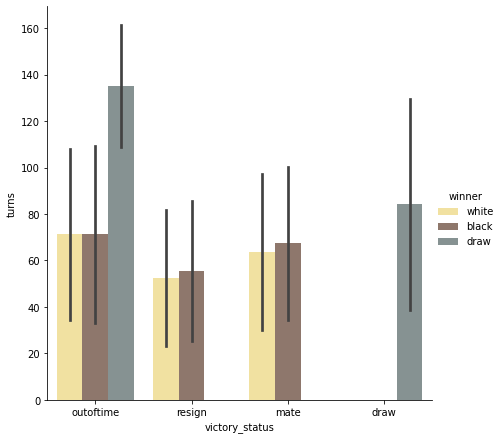

In [45]:
g = sns.catplot(
    data=df, kind="bar",
    x="victory_status", y="turns", hue="winner",
    ci="sd", alpha=.6, height=6,palette=sns.color_palette(['#ffdb4d','#4d1a00','#334d4d']))

### Another visualization method

In [48]:
fig = px.bar_polar(group1, r="values", theta="victory_status",
    color="winner", template="plotly_dark",
    color_discrete_sequence=px.colors.sequential.Plasma_r
)
fig.show()

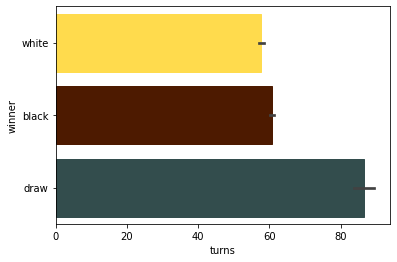

In [49]:
g4 = sns.barplot(x='turns', y='winner',data =df)
colors = ['#ffdb4d','#4d1a00','#334d4d']
for i in range(0,3):
    g4.patches[i].set_color(colors[i])


###  Another version of this proof via animation

In [50]:
g5 = px.scatter(df, x="victory_status", y="turns", animation_frame="opening_ply", animation_group="winner",
            hover_name="winner",color = 'winner')
g5.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1000
g5.show()

In [51]:
opening = df.groupby('opening_name')[['white_rating']].mean().sort_values('white_rating', ascending = False).head(15)
opening

,white_rating
opening_name,
Russian Game: Modern Attack | Murrey Variation,2621.000000
Queen's Gambit Declined: Westphalian Variation,2619.000000
Tarrasch Defense: Classical Variation | Carlsbad Variation,2586.000000
Gruenfeld Defense: Botvinnik Variation,2485.000000
English Opening: Anglo-Indian Defense | Old Indian Formation,2454.000000
Queen's Indian Defense: Classical Variation | Traditional Variation | Nimzowitsch Line,2452.000000
Dutch Defense: Ilyin-Zhenevsky | Winter Variation,2440.000000
Modern Defense: Averbakh System | Kotov Variation,2432.000000
Benoni Defense: Classical Variation | Averbakh-Grivas Attack,2428.000000


In [52]:
opening2 = df.groupby('opening_name')[['black_rating']].mean().sort_values('black_rating', ascending = False).head(15)
opening2

,black_rating
opening_name,
Ruy Lopez: Schliemann Defense | Tartakower Variation,2526.000000
Neo-Gruenfeld Defense: Non- or Delayed Fianchetto,2441.000000
Latvian Gambit Accepted | Main Line,2366.000000
Ruy Lopez: Open Variations | Howell Attack #2,2362.000000
King's Gambit Declined: Falkbeer | Milner-Barry Variation,2361.000000
Benoni Defense: Classical Variation | Averbakh-Grivas Attack,2360.000000
French Defense: Tarrasch Variation | Guimard Defense | Main Line,2355.500000
Tarrasch Defense: Classical Variation | Advance Variation,2353.000000
Benko Gambit Declined | Quiet Line,2336.000000


## Top 15 best openings depends on ratings of whites and blacks

### As we noticed above, for blacks "Defence" game tactic is more common and expected.

C:\Users\Ada\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

C:\Users\Ada\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 1.0, 'Chart 2')

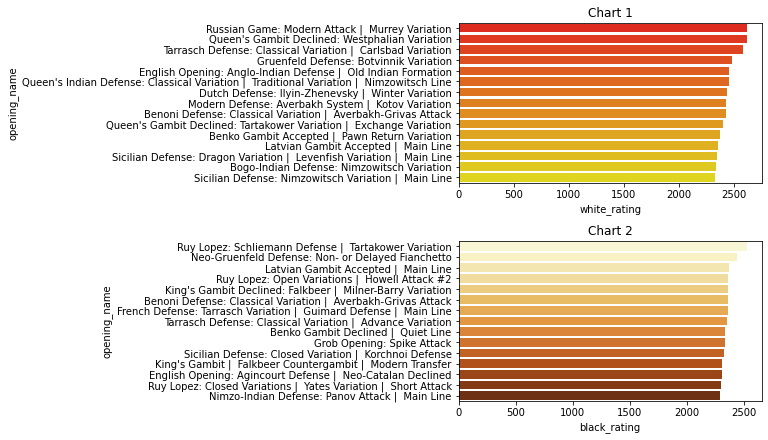

In [53]:
fig3 = plt.figure(constrained_layout=True, figsize = (15,6))
spec2 = gridspec.GridSpec(ncols=2, nrows=2, figure=fig3)
f3_ax1 = fig3.add_subplot(spec2[0, 1])
g1 = sns.barplot(opening.white_rating, opening.index,palette = 'autumn', ax = f3_ax1)

f3_ax1.set_title('Chart 1')
f3_ax2 = fig3.add_subplot(spec2[1, 1])
g2 = sns.barplot(opening2.black_rating, opening2.index,palette = "YlOrBr", ax = f3_ax2)
f3_ax2.set_title('Chart 2')

## The distribution of victory status depending on opening steps and animated via turns

In [54]:
fig = px.bar(df, x="victory_status", y="opening_ply", animation_frame="turns", hover_name="victory_status")
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1000
fig.show()

### Even though the whites win more than blacks the difference is not significant and does not depend on any other features (turns, openings, ratings). So from above researches I can reject first Hypothesis